In [1]:
%cd '~/Documents/berkeley/SavageLab/scripts/tecantaloupe_distro/'

/Users/jackdesmarais/Documents/berkeley/SavageLab/scripts/tecantaloupe_distro


In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn
import itertools

from growth.plate_spec import PlateSpec
from growth.plate_time_course_parser import SavageLabM1000Excel
from matplotlib import pyplot as plt

In [3]:
plate = """ADE1+Glucose+0	ADE2+Glucose+0	TRP1+Glucose+0	TRP2+Glucose+0	ADE1+Glucose+100	ADE2+Glucose+100	TRP1+Glucose+100	TRP2+Glucose+100
ADE1+Glucose+0	ADE2+Glucose+0	TRP1+Glucose+0	TRP2+Glucose+0	ADE1+Glucose+100	ADE2+Glucose+100	TRP1+Glucose+100	TRP2+Glucose+100
ADE1+Glucose+0	ADE2+Glucose+0	TRP1+Glucose+0	TRP2+Glucose+0	ADE1+Glucose+100	ADE2+Glucose+100	TRP1+Glucose+100	TRP2+Glucose+100
ADE1+Glucose+0	ADE2+Glucose+0	TRP1+Glucose+0	TRP2+Glucose+0	ADE1+Glucose+100	ADE2+Glucose+100	TRP1+Glucose+100	TRP2+Glucose+100
ADE1+2%galactose+0	ADE2+2%galactose+0	TRP1+2%galactose+0	TRP2+2%galactose+0	ADE1+2%galactose+100	ADE2+2%galactose+100	TRP1+2%galactose+100	TRP2+2%galactose+100
ADE1+2%galactose+0	ADE2+2%galactose+0	TRP1+2%galactose+0	TRP2+2%galactose+0	ADE1+2%galactose+100	ADE2+2%galactose+100	TRP1+2%galactose+100	TRP2+2%galactose+100
ADE1+2%galactose+0	ADE2+2%galactose+0	TRP1+2%galactose+0	TRP2+2%galactose+0	ADE1+2%galactose+100	ADE2+2%galactose+100	TRP1+2%galactose+100	TRP2+2%galactose+100
ADE1+2%galactose+0	ADE2+2%galactose+0	TRP1+2%galactose+0	TRP2+2%galactose+0	ADE1+2%galactose+100	ADE2+2%galactose+100	TRP1+2%galactose+100	TRP2+2%galactose+100
ADE1+4%galactose+0	ADE2+4%galactose+0	TRP1+4%galactose+0	TRP2+4%galactose+0	ADE1+4%galactose+100	ADE2+4%galactose+100	TRP1+4%galactose+100	TRP2+4%galactose+100
ADE1+4%galactose+0	ADE2+4%galactose+0	TRP1+4%galactose+0	TRP2+4%galactose+0	ADE1+4%galactose+100	ADE2+4%galactose+100	TRP1+4%galactose+100	TRP2+4%galactose+100
ADE1+4%galactose+0	ADE2+4%galactose+0	TRP1+4%galactose+0	TRP2+4%galactose+0	ADE1+4%galactose+100	ADE2+4%galactose+100	TRP1+4%galactose+100	TRP2+4%galactose+100
ADE1+4%galactose+0	ADE2+4%galactose+0	TRP1+4%galactose+0	TRP2+4%galactose+0	ADE1+4%galactose+100	ADE2+4%galactose+100	TRP1+4%galactose+100	TRP2+4%galactose+100"""
plate = np.array([row.split('	') for row in plate.split('\n')]).T
print(plate.shape)

# grab index from old plate
ps = PlateSpec.FromFile('growth/plate_specs/2020_03_05_FolA_library_QC.csv')
display(ps.df)
plate = pd.DataFrame(plate, columns=ps.df.columns, index=['abcdefgh'.upper()[i] for i in range(8)])
display(plate)

psloc = 'growth/plate_specs/2021_02_16_induction_test_yeast.csv'
plate.to_csv(psloc)

# PlateSpec defined in CSV for easy editing
ps = PlateSpec.FromFile(psloc)
name_mapping = ps.well_to_name_mapping()

# PlateSpec contains a DataFrame with the mapping. 
ps.df

(8, 12)


value_type                             name                                   \
column                                    1                                2   
A           Suppliments_1Cycle_Lon_1E6Lib 1  Suppliments_1Cycle_Lon_1E6Lib 2   
B           Suppliments_1Cycle_Lon_1E6Lib 1  Suppliments_1Cycle_Lon_1E6Lib 2   
C           Suppliments_3Cycle_Lon_1E5Lib 1  Suppliments_3Cycle_Lon_1E5Lib 2   
D           Suppliments_3Cycle_Lon_1E5Lib 1  Suppliments_3Cycle_Lon_1E5Lib 2   
E              thyA_sup_3Cycle_Lon_1E5Lib 1     thyA_sup_3Cycle_Lon_1E5Lib 2   
F              thyA_sup_3Cycle_Lon_1E5Lib 1     thyA_sup_3Cycle_Lon_1E5Lib 2   
G              thyA_sup_1Cycle_Lon_1E6Lib 1     thyA_sup_1Cycle_Lon_1E6Lib 2   
H              thyA_sup_1Cycle_Lon_1E6Lib 1     thyA_sup_1Cycle_Lon_1E6Lib 2   

value_type                                                                    \
column                                    3                                4   
A           Suppliments_1Cycle_Lon_1E6Lib 3  Suppliments_1Cycle_Lon_1E6Lib 4   
B           Suppliments_1Cycle_Lon_1E6Lib 3  Suppliments_1Cycle_Lon_1E6Lib 4   
C           Suppliments_3Cycle_Lon_1E5Lib 3  Suppliments_3Cycle_Lon_1E5Lib 4   
D           Suppliments_3Cycle_Lon_1E5Lib 3  Suppliments_3Cycle_Lon_1E5Lib 4   
E              thyA_sup_3Cycle_Lon_1E5Lib 3     thyA_sup_3Cycle_Lon_1E5Lib 4   
F              thyA_sup_3Cycle_Lon_1E5Lib 3     thyA_sup_3Cycle_Lon_1E5Lib 4   
G              thyA_sup_1Cycle_Lon_1E6Lib 3     thyA_sup_1Cycle_Lon_1E6Lib 4   
H              thyA_sup_1Cycle_Lon_1E6Lib 3     thyA_sup_1Cycle_Lon_1E6Lib 4   

value_type                                                                    \
column                                    5                                6   
A           Suppliments_1Cycle_Lon_1E6Lib 5  Suppliments_1Cycle_Lon_1E6Lib 6   
B           Suppliments_1Cycle_Lon_1E6Lib 5  Suppliments_1Cycle_Lon_1E6Lib 6   
C           Suppliments_3Cycle_Lon_1E5Lib 5  Suppliments_3Cycle_Lon_1E5Lib 6   
D           Suppliments_3Cycle_Lon_1E5Lib 5  Suppliments_3Cycle_Lon_1E5Lib 6   
E              thyA_sup_3Cycle_Lon_1E5Lib 5     thyA_sup_3Cycle_Lon_1E5Lib 6   
F              thyA_sup_3Cycle_Lon_1E5Lib 5     thyA_sup_3Cycle_Lon_1E5Lib 6   
G              thyA_sup_1Cycle_Lon_1E6Lib 5     thyA_sup_1Cycle_Lon_1E6Lib 6   
H              thyA_sup_1Cycle_Lon_1E6Lib 5     thyA_sup_1Cycle_Lon_1E6Lib 6   

value_type                                                                    \
column                                    7                                8   
A           Suppliments_1Cycle_Lon_1E6Lib 7  Suppliments_1Cycle_Lon_1E6Lib 8   
B           Suppliments_1Cycle_Lon_1E6Lib 7  Suppliments_1Cycle_Lon_1E6Lib 8   
C           Suppliments_3Cycle_Lon_1E5Lib 7  Suppliments_3Cycle_Lon_1E5Lib 8   
D           Suppliments_3Cycle_Lon_1E5Lib 7  Suppliments_3Cycle_Lon_1E5Lib 8   
E              thyA_sup_3Cycle_Lon_1E5Lib 7     thyA_sup_3Cycle_Lon_1E5Lib 8   
F              thyA_sup_3Cycle_Lon_1E5Lib 7     thyA_sup_3Cycle_Lon_1E5Lib 8   
G              thyA_sup_1Cycle_Lon_1E6Lib 7     thyA_sup_1Cycle_Lon_1E6Lib 8   
H              thyA_sup_1Cycle_Lon_1E6Lib 7     thyA_sup_1Cycle_Lon_1E6Lib 8   

value_type                                                                     \
column                                    9                                10   
A           Suppliments_1Cycle_Lon_1E6Lib 9  Suppliments_1Cycle_Lon_1E6Lib_10   
B           Suppliments_1Cycle_Lon_1E6Lib 9  Suppliments_1Cycle_Lon_1E6Lib_10   
C           Suppliments_3Cycle_Lon_1E5Lib 9  Suppliments_3Cycle_Lon_1E5Lib_10   
D           Suppliments_3Cycle_Lon_1E5Lib 9  Suppliments_3Cycle_Lon_1E5Lib_10   
E              thyA_sup_3Cycle_Lon_1E5Lib 9     thyA_sup_3Cycle_Lon_1E5Lib_10   
F              thyA_sup_3Cycle_Lon_1E5Lib 9     thyA_sup_3Cycle_Lon_1E5Lib_10   
G              thyA_sup_1Cycle_Lon_1E6Lib 9     thyA_sup_1Cycle_Lon_1E6Lib_10   
H              thyA_sup_1Cycle_Lon_1E6Lib 9     thyA_sup_1Cycle_Lon

value_type              name                                      \
column                     1                 2                 3   
A             ADE1+Glucose+0    ADE1+Glucose+0    ADE1+Glucose+0   
B             ADE2+Glucose+0    ADE2+Glucose+0    ADE2+Glucose+0   
C             TRP1+Glucose+0    TRP1+Glucose+0    TRP1+Glucose+0   
D             TRP2+Glucose+0    TRP2+Glucose+0    TRP2+Glucose+0   
E           ADE1+Glucose+100  ADE1+Glucose+100  ADE1+Glucose+100   
F           ADE2+Glucose+100  ADE2+Glucose+100  ADE2+Glucose+100   
G           TRP1+Glucose+100  TRP1+Glucose+100  TRP1+Glucose+100   
H           TRP2+Glucose+100  TRP2+Glucose+100  TRP2+Glucose+100   

value_type                                                                \
column                     4                     5                     6   
A             ADE1+Glucose+0    ADE1+2%galactose+0    ADE1+2%galactose+0   
B             ADE2+Glucose+0    ADE2+2%galactose+0    ADE2+2%galactose+0   
C             TRP1+Glucose+0    TRP1+2%galactose+0    TRP1+2%galactose+0   
D             TRP2+Glucose+0    TRP2+2%galactose+0    TRP2+2%galactose+0   
E           ADE1+Glucose+100  ADE1+2%galactose+100  ADE1+2%galactose+100   
F           ADE2+Glucose+100  ADE2+2%galactose+100  ADE2+2%galactose+100   
G           TRP1+Glucose+100  TRP1+2%galactose+100  TRP1+2%galactose+100   
H           TRP2+Glucose+100  TRP2+2%galactose+100  TRP2+2%galactose+100   

value_type                                                                    \
column                         7                     8                     9   
A             ADE1+2%galactose+0    ADE1+2%galactose+0    ADE1+4%galactose+0   
B             ADE2+2%galactose+0    ADE2+2%galactose+0    ADE2+4%galactose+0   
C             TRP1+2%galactose+0    TRP1+2%galactose+0    TRP1+4%galactose+0   
D             TRP2+2%galactose+0    TRP2+2%galactose+0    TRP2+4%galactose+0   
E           ADE1+2%galactose+100  ADE1+2%galactose+100  ADE1+4%galactose+100   
F           ADE2+2%galactose+100  ADE2+2%galactose+100  ADE2+4%galactose+100   
G           TRP1+2%galactose+100  TRP1+2%galactose+100  TRP1+4%galactose+100   
H           TRP2+2%galactose+100  TRP2+2%galactose+100  TRP2+4%galactose+100   

value_type                                                                    
column                        10                    11                    12  
A             ADE1+4%galactose+0    ADE1+4%galactose+0    ADE1+4%galactose+0  
B             ADE2+4%galactose+0    ADE2+4%galactose+0    ADE2+4%galactose+0  
C             TRP1+4%galactose+0    TRP1+4%galactose+0    TRP1+4%galactose+0  
D             TRP2+4%galactose+0    TRP2+4%galactose+0    TRP2+4%galactose+0  
E           ADE1+4%galactose+100  ADE1+4%galactose+100  ADE1+4%galactose+100  
F           ADE2+4%galactose+100  ADE2+4%galactose+100  ADE2+4%galactose+100  
G           TRP1+4%galactose+100  TRP1+4%galactose+100  TRP1+4%galactose+100  
H           TRP2+4%galactose+100  TRP2+4%galactose+100  TRP2+4%galactose+100

value_type              name                                      \
column                     1                 2                 3   
A             ADE1+Glucose+0    ADE1+Glucose+0    ADE1+Glucose+0   
B             ADE2+Glucose+0    ADE2+Glucose+0    ADE2+Glucose+0   
C             TRP1+Glucose+0    TRP1+Glucose+0    TRP1+Glucose+0   
D             TRP2+Glucose+0    TRP2+Glucose+0    TRP2+Glucose+0   
E           ADE1+Glucose+100  ADE1+Glucose+100  ADE1+Glucose+100   
F           ADE2+Glucose+100  ADE2+Glucose+100  ADE2+Glucose+100   
G           TRP1+Glucose+100  TRP1+Glucose+100  TRP1+Glucose+100   
H           TRP2+Glucose+100  TRP2+Glucose+100  TRP2+Glucose+100   

value_type                                                                \
column                     4                     5                     6   
A             ADE1+Glucose+0    ADE1+2%galactose+0    ADE1+2%galactose+0   
B             ADE2+Glucose+0    ADE2+2%galactose+0    ADE2+2%galactose+0   
C             TRP1+Glucose+0    TRP1+2%galactose+0    TRP1+2%galactose+0   
D             TRP2+Glucose+0    TRP2+2%galactose+0    TRP2+2%galactose+0   
E           ADE1+Glucose+100  ADE1+2%galactose+100  ADE1+2%galactose+100   
F           ADE2+Glucose+100  ADE2+2%galactose+100  ADE2+2%galactose+100   
G           TRP1+Glucose+100  TRP1+2%galactose+100  TRP1+2%galactose+100   
H           TRP2+Glucose+100  TRP2+2%galactose+100  TRP2+2%galactose+100   

value_type                                                                    \
column                         7                     8                     9   
A             ADE1+2%galactose+0    ADE1+2%galactose+0    ADE1+4%galactose+0   
B             ADE2+2%galactose+0    ADE2+2%galactose+0    ADE2+4%galactose+0   
C             TRP1+2%galactose+0    TRP1+2%galactose+0    TRP1+4%galactose+0   
D             TRP2+2%galactose+0    TRP2+2%galactose+0    TRP2+4%galactose+0   
E           ADE1+2%galactose+100  ADE1+2%galactose+100  ADE1+4%galactose+100   
F           ADE2+2%galactose+100  ADE2+2%galactose+100  ADE2+4%galactose+100   
G           TRP1+2%galactose+100  TRP1+2%galactose+100  TRP1+4%galactose+100   
H           TRP2+2%galactose+100  TRP2+2%galactose+100  TRP2+4%galactose+100   

value_type                                                                    
column                        10                    11                    12  
A             ADE1+4%galactose+0    ADE1+4%galactose+0    ADE1+4%galactose+0  
B             ADE2+4%galactose+0    ADE2+4%galactose+0    ADE2+4%galactose+0  
C             TRP1+4%galactose+0    TRP1+4%galactose+0    TRP1+4%galactose+0  
D             TRP2+4%galactose+0    TRP2+4%galactose+0    TRP2+4%galactose+0  
E           ADE1+4%galactose+100  ADE1+4%galactose+100  ADE1+4%galactose+100  
F           ADE2+4%galactose+100  ADE2+4%galactose+100  ADE2+4%galactose+100  
G           TRP1+4%galactose+100  TRP1+4%galactose+100  TRP1+4%galactose+100  
H           TRP2+4%galactose+100  TRP2+4%galactose+100  TRP2+4%galactose+100

In [5]:
parser = SavageLabM1000Excel()
timecourse = parser.ParseFromFilename('growth/data/2021_2_16_Yeast_Promotors.xlsx')

blanked = timecourse.blank()
# You can blank each well against it's own early timepoints
# by not setting blank_wells

# Smooth with default params.
smoothed = blanked.smooth()

['abs600', 'mCherry', 'sfGFP', 'sfGFP2']


<Figure size 720x720 with 0 Axes>

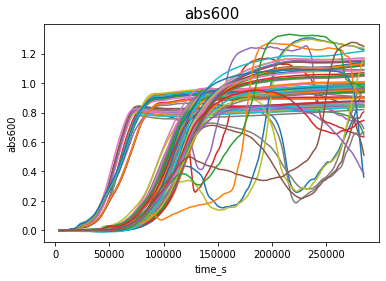

<Figure size 720x720 with 0 Axes>

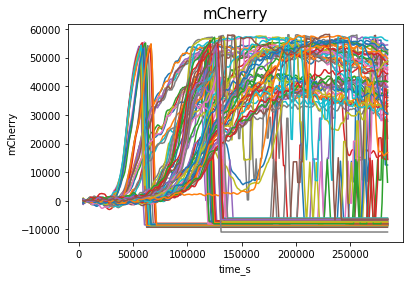

<Figure size 720x720 with 0 Axes>

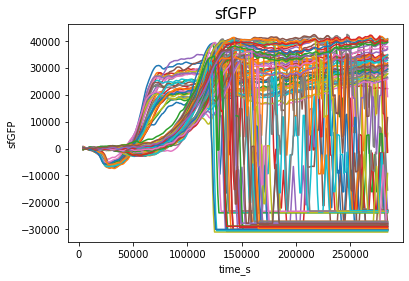

<Figure size 720x720 with 0 Axes>

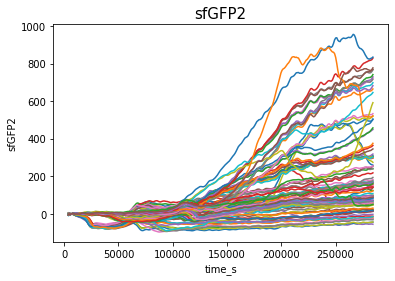

In [6]:
# Smoothed & blanked data.
print(timecourse.labels())
for label in timecourse.labels():
    fig = plt.figure(figsize=(10,10))
    OD_data = smoothed.data_for_label(label)
    OD_data.plot(x='time_s', legend=False)
    plt.ylabel(label)
    plt.title(label, fontsize=15)
    plt.show()


In [7]:
OD_data = smoothed.data_for_label('mCherry')
display(OD_data)
max(OD_data.drop('time_s',axis=1).max())

well,time_s,A1,B1,C1,D1,E1,F1,G1,H1,A2,...,G11,H11,A12,B12,C12,D12,E12,F12,G12,H12
cycle_n,,,,,,,,,,,,,,,,,,,,,
5,4033.4,-812.755556,-575.155556,-622.377778,-222.866667,-3.688889,-783.533333,-724.244444,240.066667,162.888889,...,-160.222222,-74.977778,-280.844444,-29.866667,-545.822222,168.311111,239.177778,221.511111,416.733333,-6.733333
6,5041.7,-408.533333,-559.155556,-165.711111,-260.644444,-15.133333,-566.200000,-698.911111,137.844444,-119.888889,...,-347.000000,-32.200000,-496.511111,308.244444,-297.488889,-160.355556,263.733333,-43.822222,373.844444,-184.400000
7,6050.1,-26.644444,-66.600000,75.400000,-43.422222,19.755556,-327.422222,-281.133333,-155.933333,-176.777778,...,-580.000000,-50.311111,-440.955556,340.911111,26.177778,-180.688889,259.622222,-135.377778,224.844444,45.377778
8,7058.4,150.577778,356.733333,111.177778,-30.977778,-2.355556,-122.200000,189.200000,-72.822222,-32.666667,...,-322.777778,-142.644444,-38.177778,-57.311111,246.622222,93.755556,-64.600000,142.844444,-109.155556,203.711111
9,8066.8,-20.755556,514.844444,-6.711111,141.911111,133.977778,-47.088889,382.644444,117.622222,137.000000,...,129.444444,-12.088889,386.044444,-278.200000,-153.933333,213.422222,-231.822222,325.400000,-261.711111,338.933333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279,280318.9,34427.911111,53509.844444,33736.844444,15066.244444,-8383.800000,-9223.200000,-8058.800000,-7975.600000,51116.444444,...,-6377.000000,-6416.200000,47835.933333,56761.355556,32442.177778,16105.644444,-6451.600000,-6540.600000,-6508.600000,-6651.400000
280,281327.3,19866.244444,53561.066667,33622.066667,14752.244444,-8383.800000,-9223.200000,-8058.800000,-7975.600000,50971.888889,...,-6377.000000,-6416.200000,48346.377778,56319.911111,31334.622222,15690.866667,-6451.600000,-6540.600000,-6508.600000,-6651.400000
281,282335.7,12576.355556,53159.733333,33049.955556,14430.800000,-8383.800000,-9223.200000,-8058.800000,-7975.600000,51338.888889,...,-6377.000000,-6416.200000,48507.044444,56165.466667,30842.622222,16299.866667,-6451.600000,-6540.600000,-6508.600000,-6651.400000


58125.48888888888

['abs600', 'mCherry', 'sfGFP', 'sfGFP2']


<Figure size 720x720 with 0 Axes>

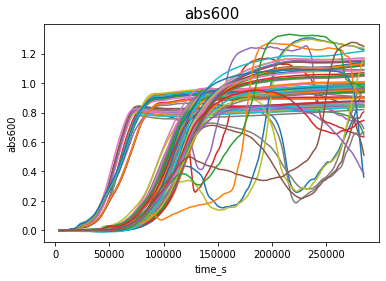

<Figure size 720x720 with 0 Axes>

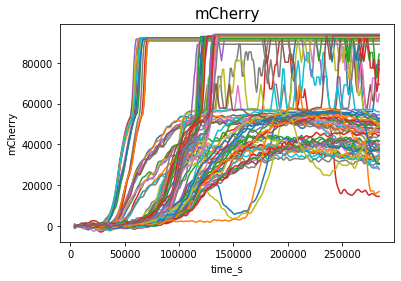

<Figure size 720x720 with 0 Axes>

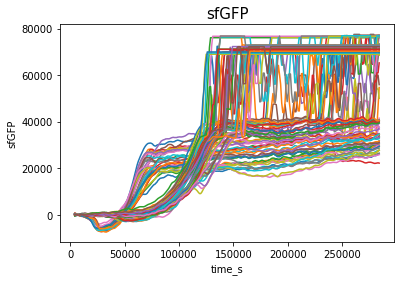

<Figure size 720x720 with 0 Axes>

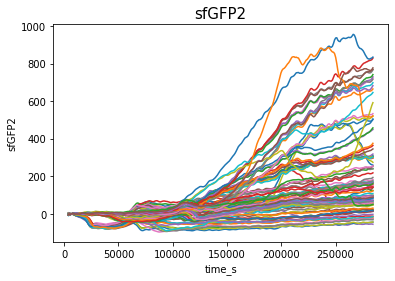

In [25]:
parser = SavageLabM1000Excel(overflow=100000)
timecourse = parser.ParseFromFilename('growth/data/2021_2_16_Yeast_Promotors.xlsx')

blanked = timecourse.blank()
# You can blank each well against it's own early timepoints
# by not setting blank_wells

# Smooth with default params.
smoothed = blanked.smooth()

# Smoothed & blanked data.
print(timecourse.labels())
for label in timecourse.labels():
    fig = plt.figure(figsize=(10,10))
    OD_data = smoothed.data_for_label(label)
    OD_data.plot(x='time_s', legend=False)
    plt.ylabel(label)
    plt.title(label, fontsize=15)
    plt.show()

In [26]:
means = smoothed.mean_by_name(ps)
means.data_for_label('abs600').columns

Index(['ADE1+2%galactose+0', 'ADE1+2%galactose+100', 'ADE1+4%galactose+0',
       'ADE1+4%galactose+100', 'ADE1+Glucose+0', 'ADE1+Glucose+100',
       'ADE2+2%galactose+0', 'ADE2+2%galactose+100', 'ADE2+4%galactose+0',
       'ADE2+4%galactose+100', 'ADE2+Glucose+0', 'ADE2+Glucose+100',
       'TRP1+2%galactose+0', 'TRP1+2%galactose+100', 'TRP1+4%galactose+0',
       'TRP1+4%galactose+100', 'TRP1+Glucose+0', 'TRP1+Glucose+100',
       'TRP2+2%galactose+0', 'TRP2+2%galactose+100', 'TRP2+4%galactose+0',
       'TRP2+4%galactose+100', 'TRP2+Glucose+0', 'TRP2+Glucose+100', 'time_s'],
      dtype='object', name='label')

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


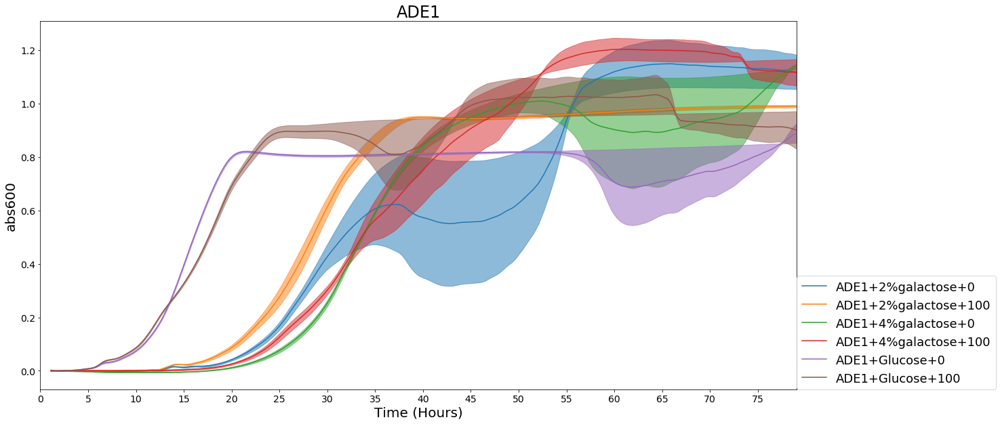

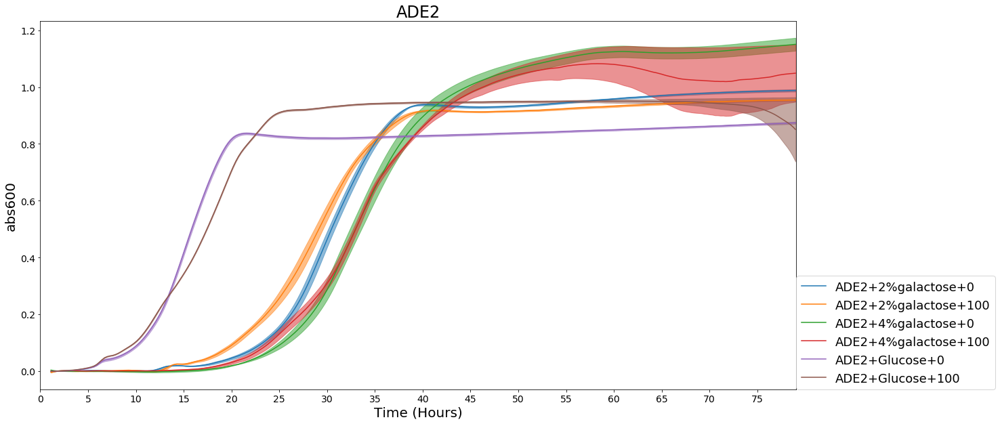

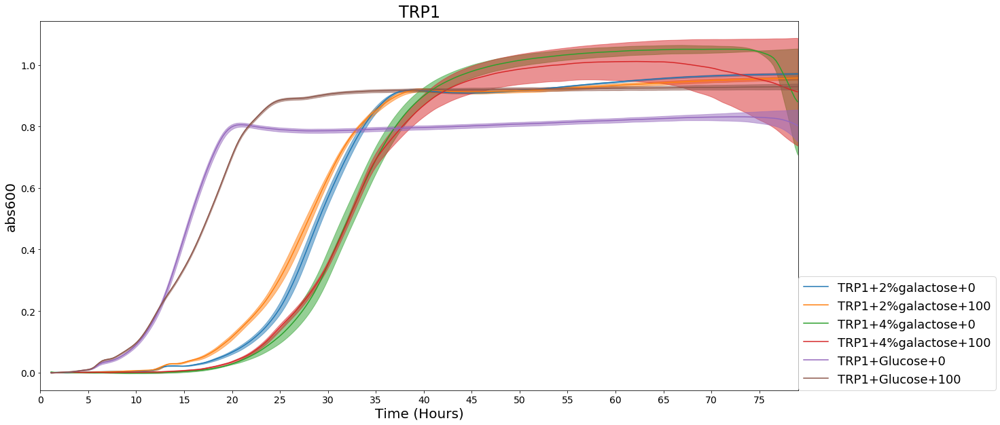

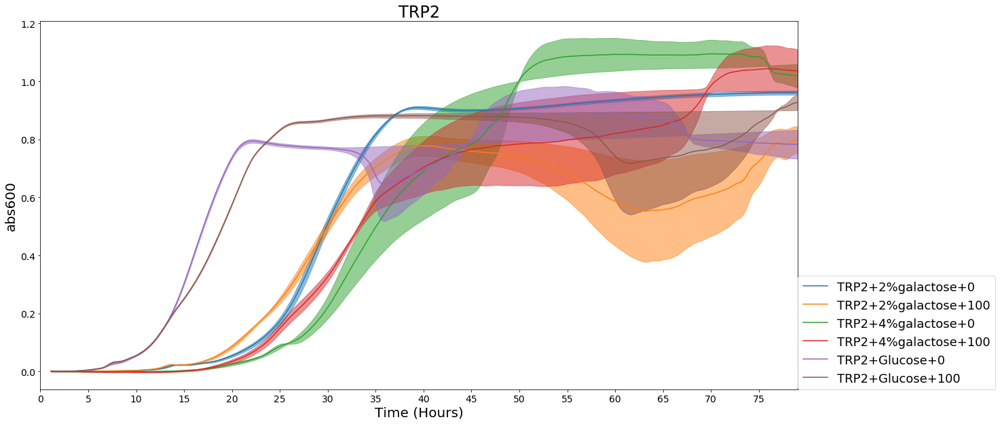

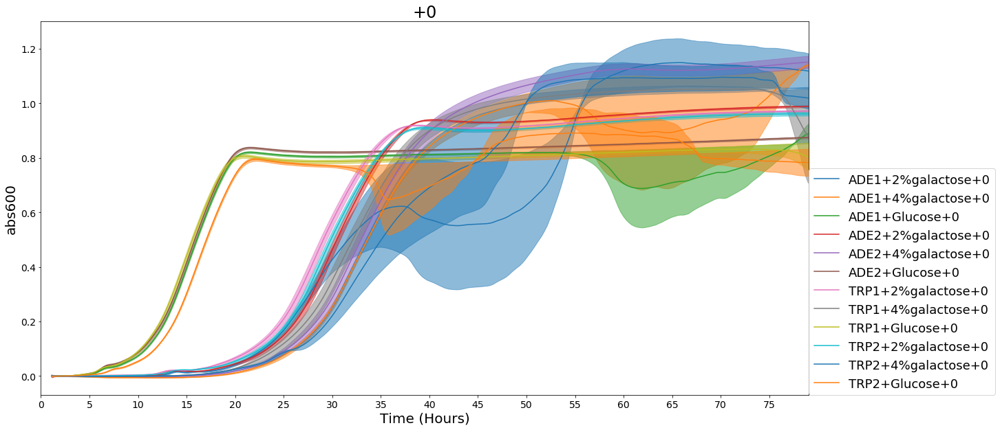

...

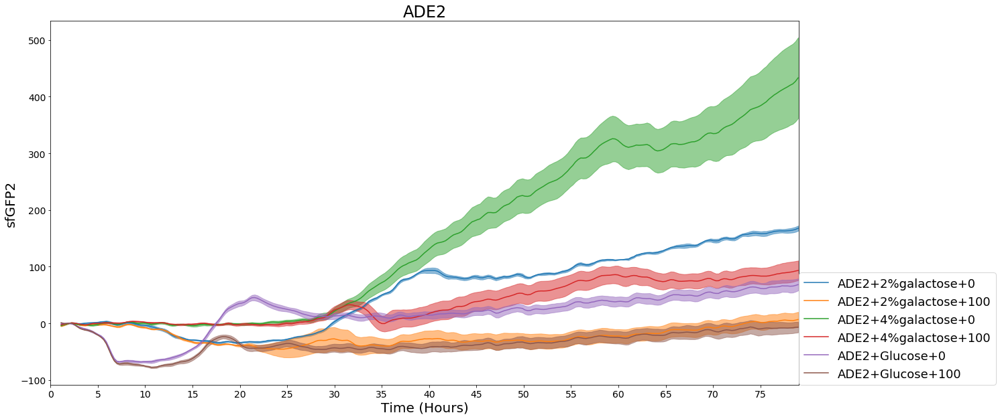

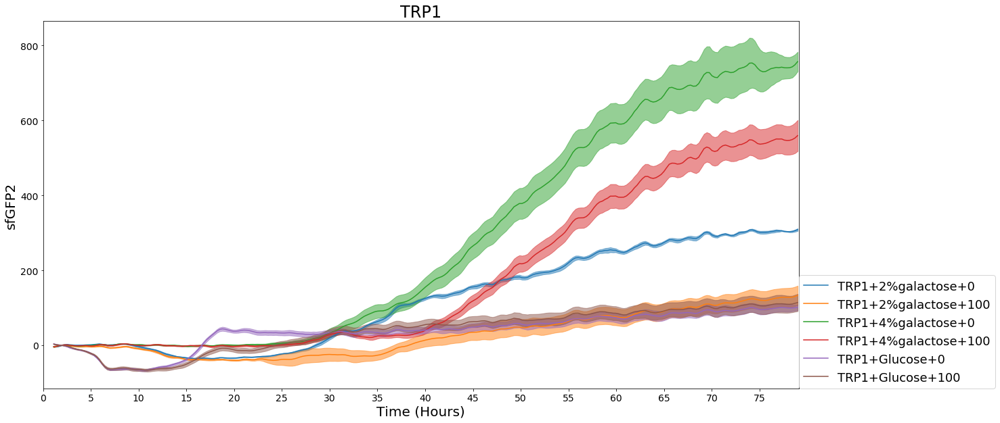

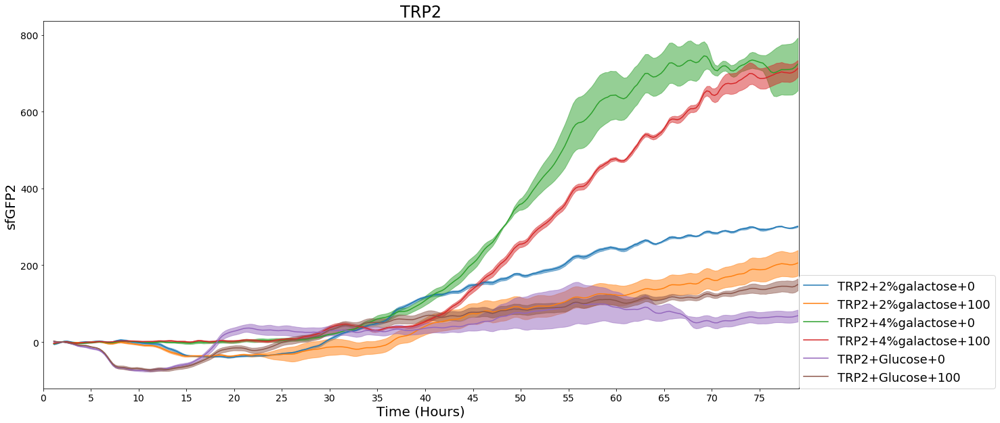

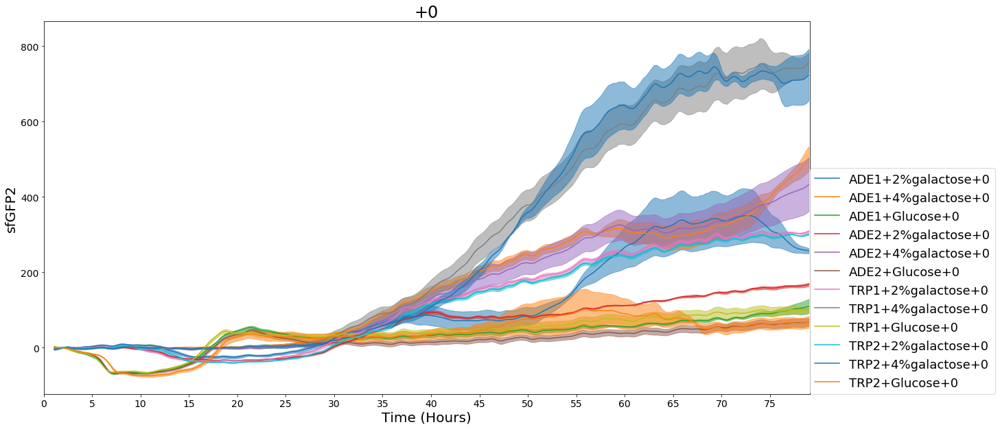

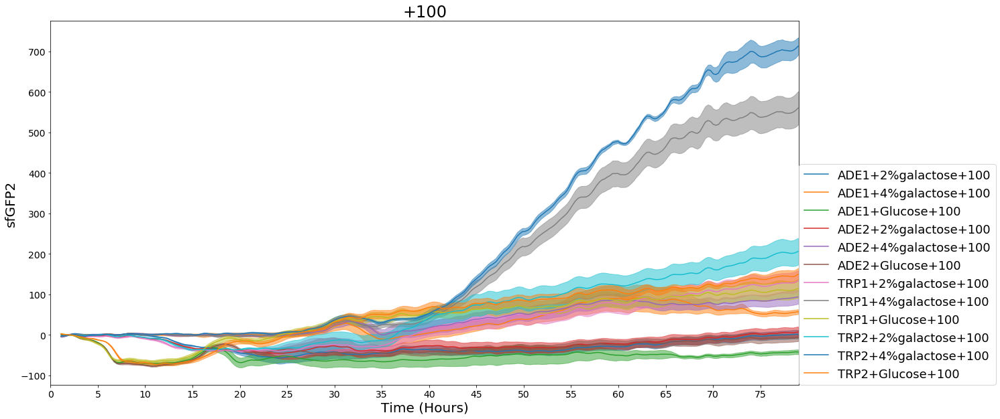

In [27]:
# figure outr what;s going on with means

means = smoothed.mean_by_name(ps)
sems = smoothed.sem_by_name(ps)

for measure in timecourse.labels():
    mean_OD = means.data_for_label(measure)
    sems_OD = sems.data_for_label(measure)

    # groupings of samples for plotting
    samples = ['ADE1','ADE2','TRP1','TRP2']

    for sample in samples:
        plt.figure(figsize=(20,10))
        time_h = mean_OD.time_s / (60.0*60.0)

        colors = seaborn.color_palette()
        for i, c in enumerate([c for c in mean_OD.columns if (c.startswith(sample))]):
            label = c
            color = colors[i % len(colors)]
            plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                             color=color, alpha=0.5)
            plt.plot(time_h, mean_OD[c], label=label, color=color)


        plt.legend(loc=(1,0), fontsize=18)
        plt.xlim(0, np.max(time_h)+.1)
    #     plt.ylim(-0.1, 1.3)
        plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(sample, fontsize=24)
        plt.xlabel('Time (Hours)', fontsize=20)
        plt.ylabel(measure, fontsize=20)

    plt.show()

    # groupings of samples for plotting
    samples = ['+0','+100']

    for sample in samples:
        plt.figure(figsize=(20,10))
        time_h = mean_OD.time_s / (60.0*60.0)

        colors = seaborn.color_palette()
        for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
            label = c
            color = colors[i % len(colors)]
            plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                             color=color, alpha=0.5)
            plt.plot(time_h, mean_OD[c], label=label, color=color)


        plt.legend(loc=(1,0), fontsize=18)
        plt.xlim(0, np.max(time_h)+.1)
    #     plt.ylim(-0.1, 1.3)
        plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(sample, fontsize=24)
        plt.xlabel('Time (Hours)', fontsize=20)
        plt.ylabel(measure, fontsize=20)

    plt.show()

In [45]:
red_per_od = smoothed.ratio_time_course('mCherry','abs600')

means = red_per_od.mean_by_name(ps).smoothed()
sems = red_per_od.sem_by_name(ps)

means.labels()

['mCherry/abs600']

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


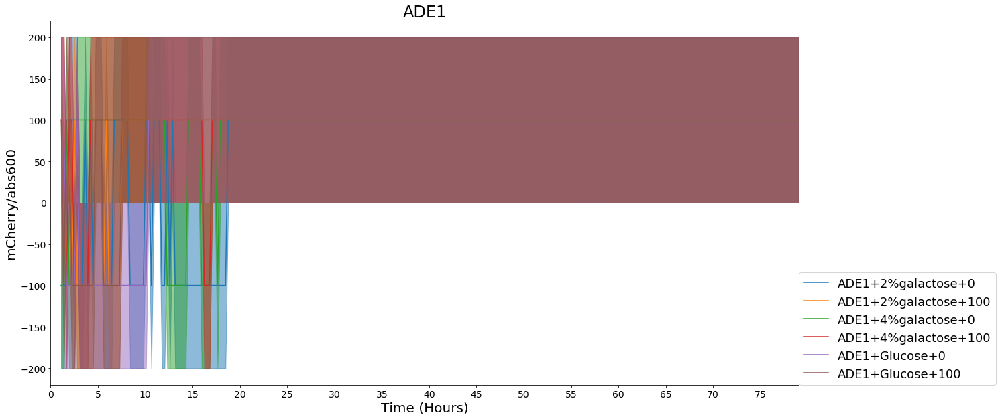

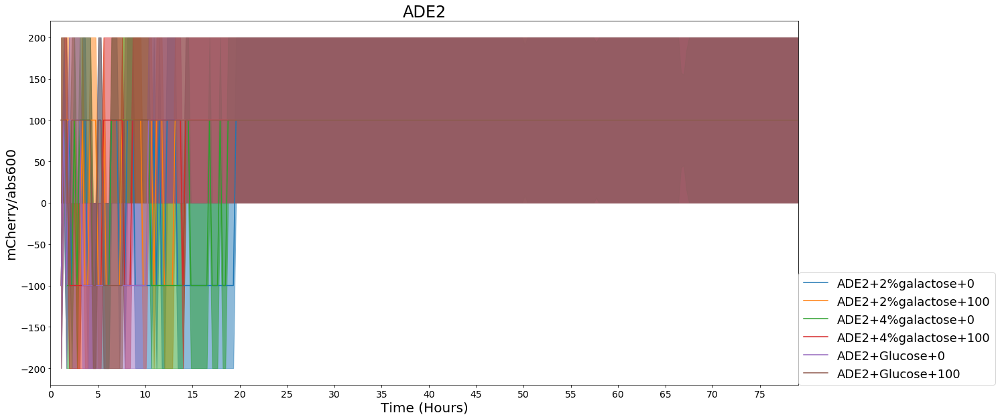

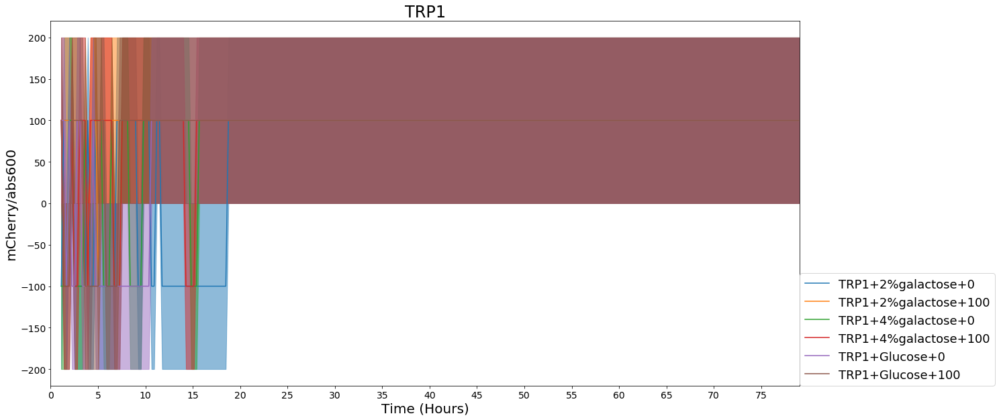

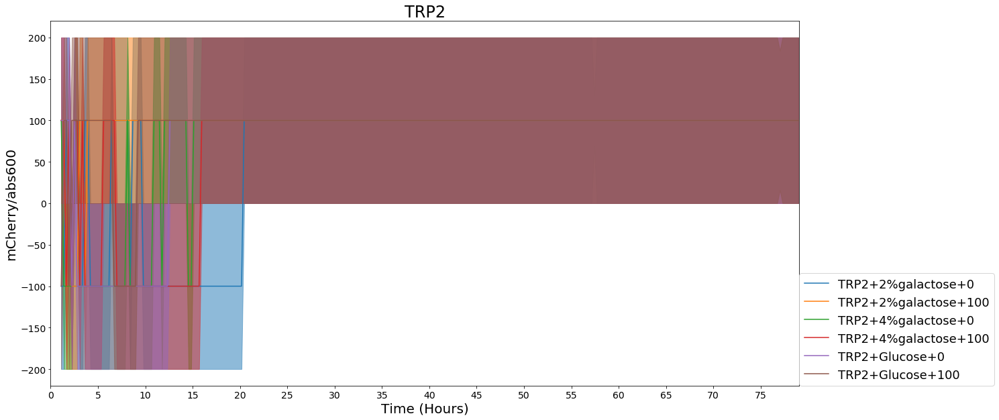

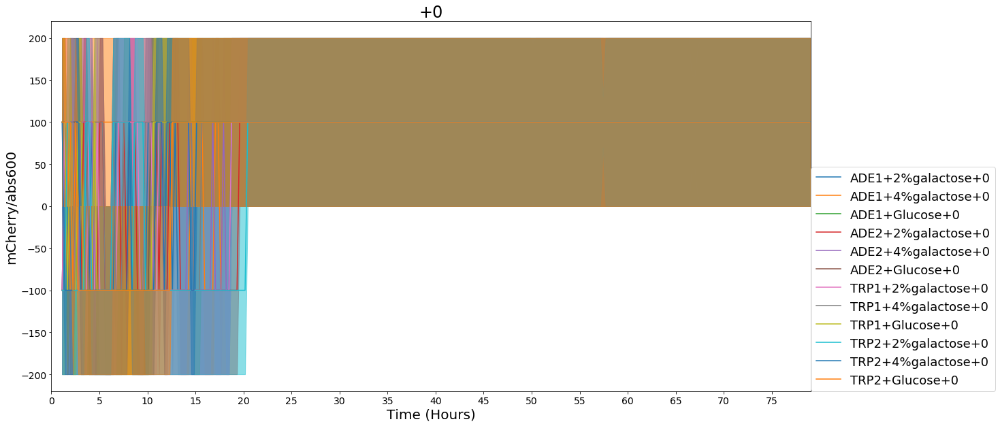

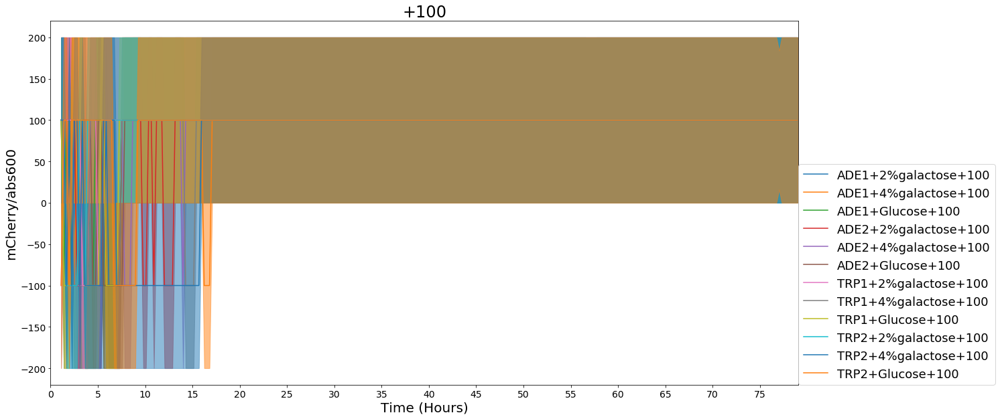

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


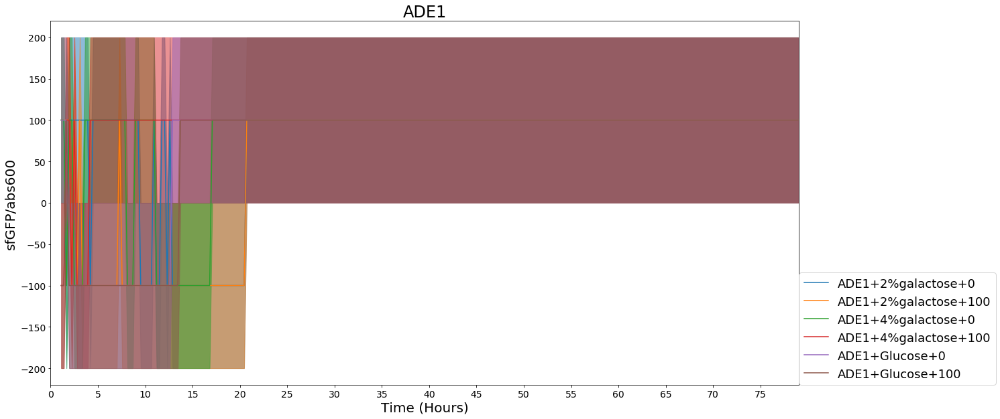

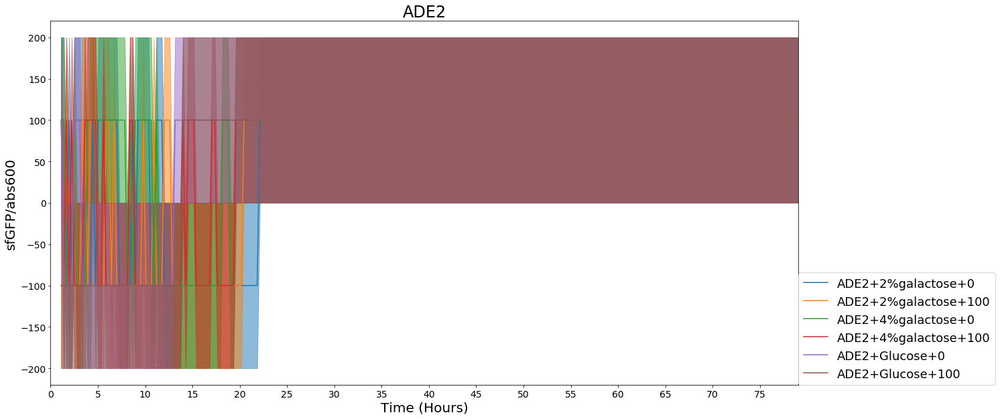

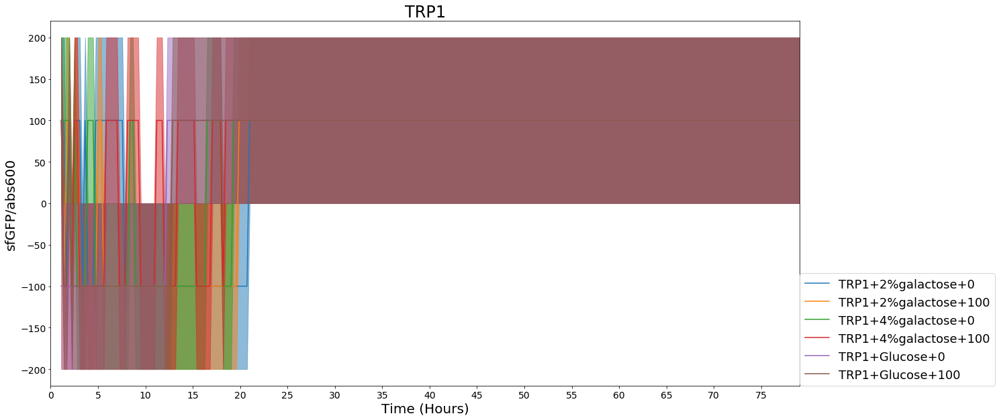

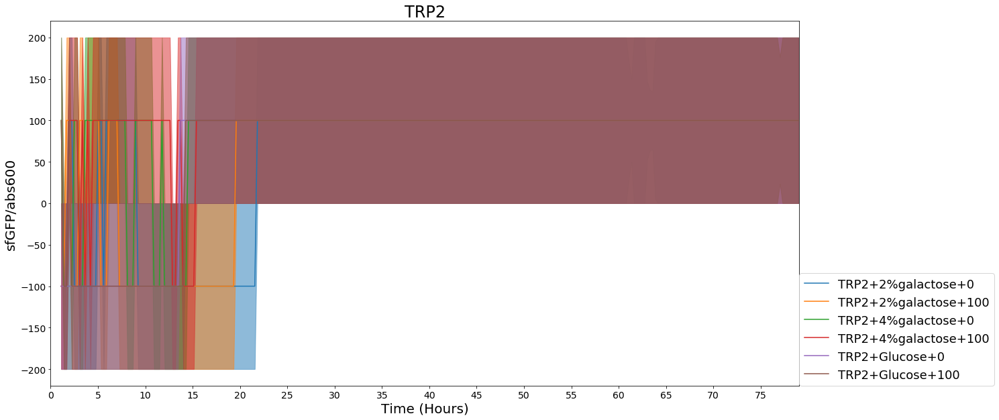

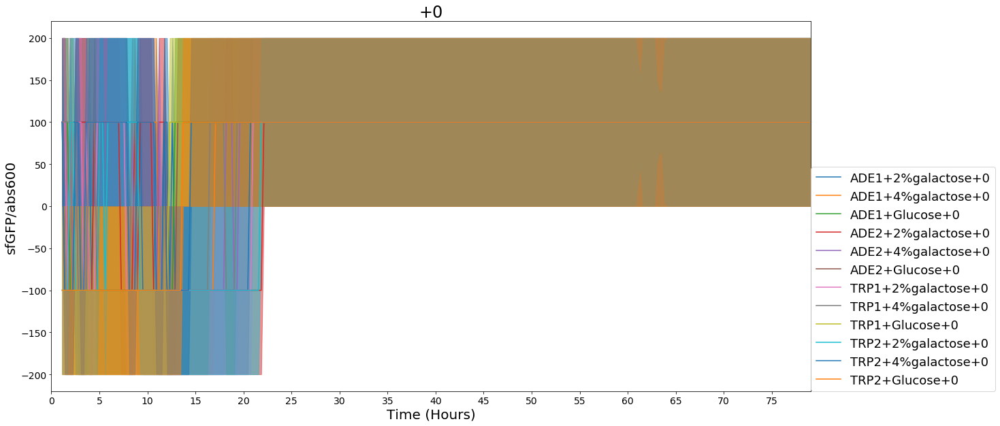

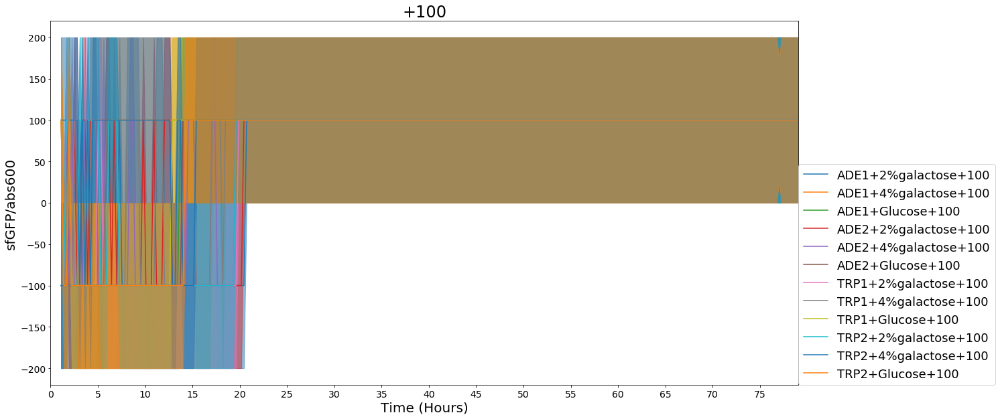

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


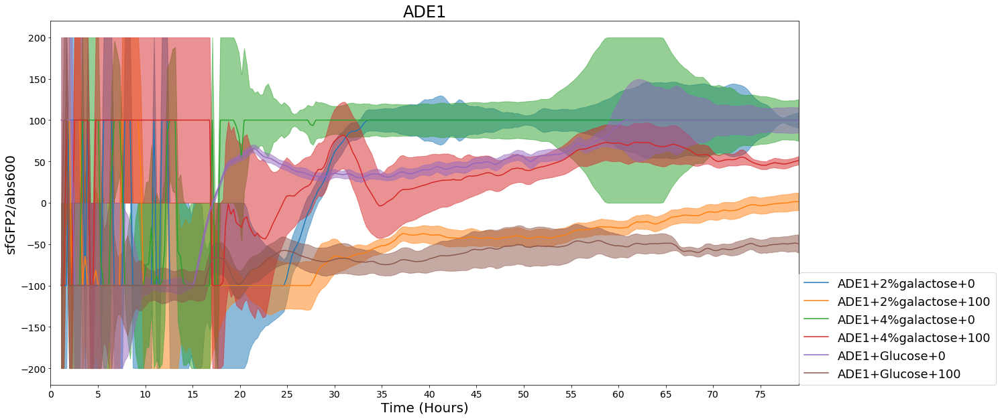

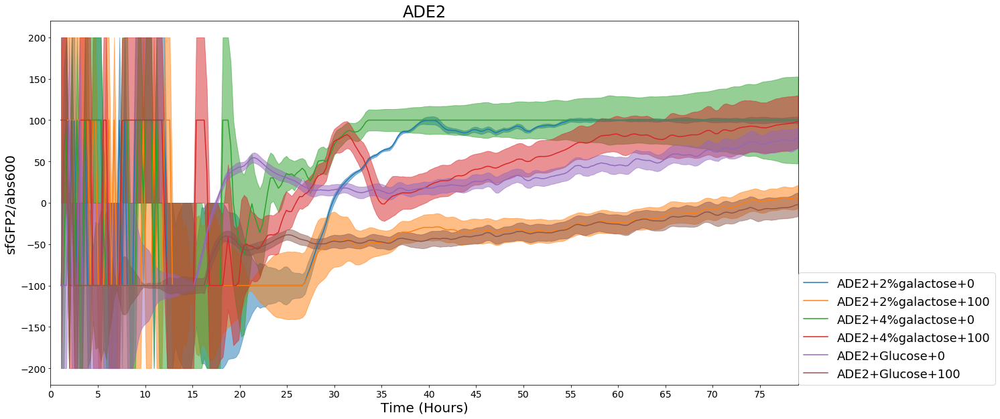

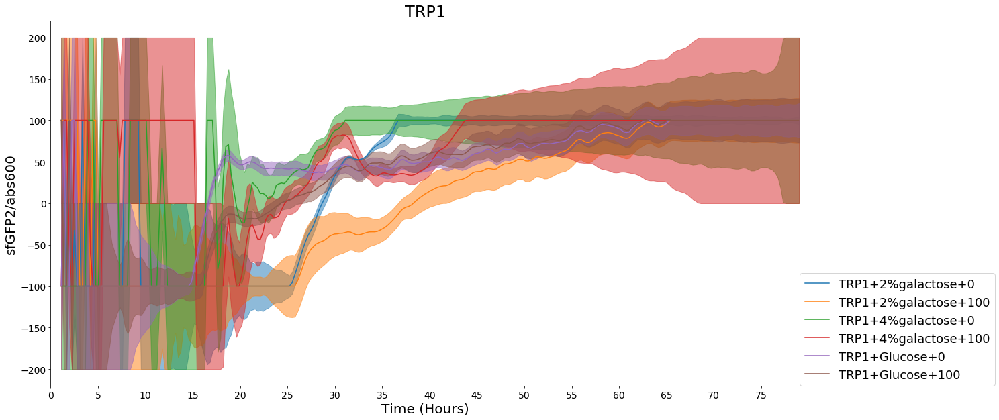

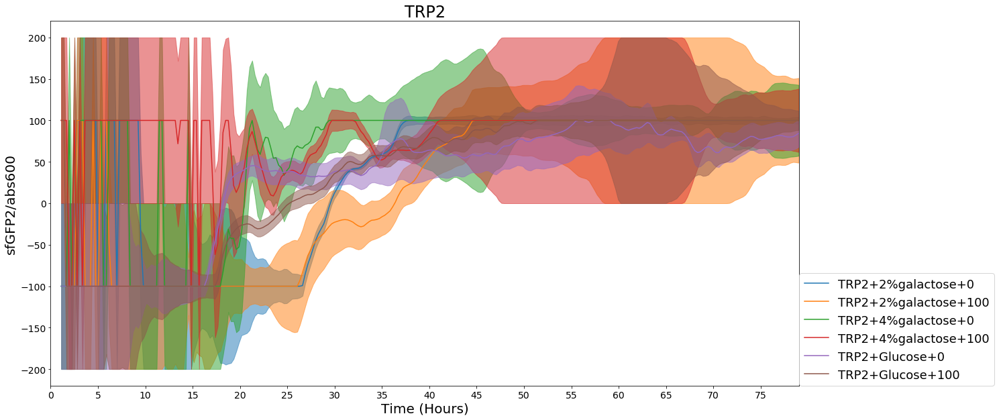

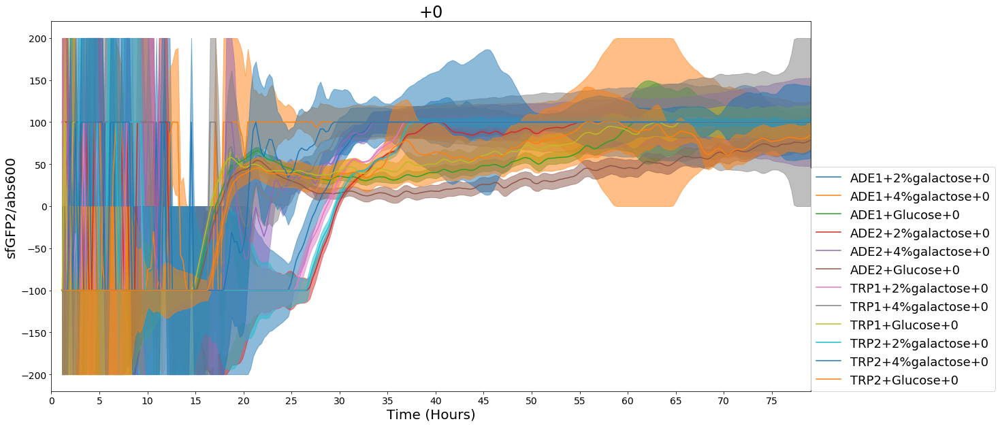

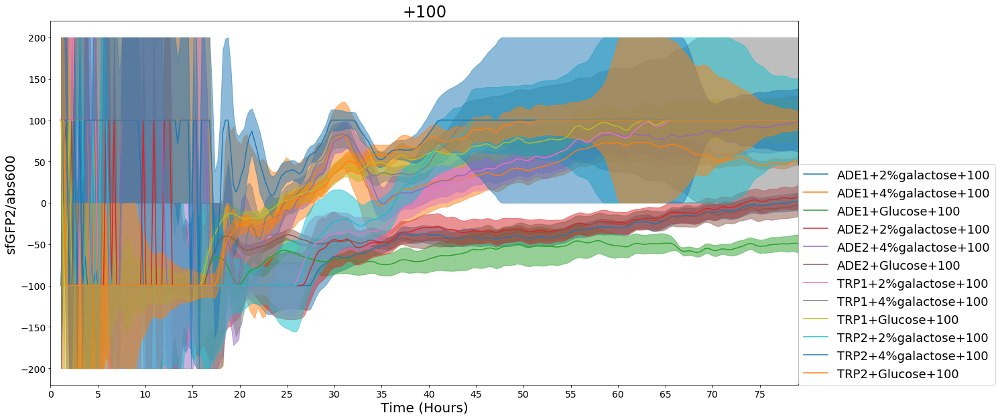

In [18]:
# figure outr what;s going on with means

for measure in ['mCherry', 'sfGFP', 'sfGFP2']:
    ratio = smoothed.ratio_time_course(measure,'abs600')
    means = ratio.mean_by_name(ps)
    sems = ratio.sem_by_name(ps)
    cap = 100
    mean_OD = means.data_for_label(measure+'/abs600')
    sems_OD = sems.data_for_label(measure+'/abs600')
    
    time_h = mean_OD.time_s / (60.0*60.0)
    
    mean_OD[mean_OD>cap]=cap
    mean_OD[mean_OD<-cap]=-cap
    
    sems_OD[sems_OD>cap]=cap
    sems_OD[sems_OD<-cap]=-cap

    # groupings of samples for plotting
    samples = ['ADE1','ADE2','TRP1','TRP2']

    for sample in samples:
        plt.figure(figsize=(20,10))

        colors = seaborn.color_palette()
        for i, c in enumerate([c for c in mean_OD.columns if (c.startswith(sample))]):
            label = c
            color = colors[i % len(colors)]
            plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                             color=color, alpha=0.5)
            plt.plot(time_h, mean_OD[c], label=label, color=color)


        plt.legend(loc=(1,0), fontsize=18)
        plt.xlim(0, np.max(time_h)+.1)
    #     plt.ylim(-0.1, 1.3)
        plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(sample, fontsize=24)
        plt.xlabel('Time (Hours)', fontsize=20)
        plt.ylabel(measure+'/abs600', fontsize=20)

    plt.show()

    # groupings of samples for plotting
    samples = ['+0','+100']

    for sample in samples:
        plt.figure(figsize=(20,10))

        colors = seaborn.color_palette()
        for i, c in enumerate([c for c in mean_OD.columns if (c.endswith(sample))]):
            label = c
            color = colors[i % len(colors)]
            plt.fill_between(time_h, mean_OD[c] - sems_OD[c], mean_OD[c] + sems_OD[c],
                             color=color, alpha=0.5)
            plt.plot(time_h, mean_OD[c], label=label, color=color)


        plt.legend(loc=(1,0), fontsize=18)
        plt.xlim(0, np.max(time_h)+.1)
    #     plt.ylim(-0.1, 1.3)
        plt.xticks(np.arange(0, np.max(time_h)+.1, 5), fontsize=14)
        plt.yticks(fontsize=14)
        plt.title(sample, fontsize=24)
        plt.xlabel('Time (Hours)', fontsize=20)
        plt.ylabel(measure+'/abs600', fontsize=20)

    plt.show()